# Multi-omics Workflow: From Raw Data to Pathway Enrichment

This notebook demonstrates a complete multi-omics study workflow using the dataset `42003_2022_3524_MOESM5_ESM.xlsx` containing multiple experiment sheets.
Each sheet corresponds to a different comparison (e.g., Control vs Treatment, Mutant vs Wild Type).
We'll cover:

1. Sample description and metadata loading
2. Data preprocessing and normalization
3. XGBoost classification of experimental groups
4. Differential analysis and pathway enrichment

---

## 1. Sample Metadata Loading

Load sample metadata from the Excel file to inspect the experimental design.

In [1]:
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler


plt.rcParams.update({'font.size': 25, 'font.family': 'Arial', 'lines.markersize': 10, 'figure.dpi': 300})

# Suppress openpyxl sparkline warning
warnings.filterwarnings(
    "ignore",
    message="Sparkline Group extension is not supported",
    category=UserWarning
)

In [2]:


file = '42003_2022_3524_MOESM5_ESM.xlsx'

# Load all sheets into a dict
data_dict = pd.read_excel(file, sheet_name=None, engine='openpyxl')
sheet_names = list(data_dict.keys())
print("Available sheets:", sheet_names)


Available sheets: ['tr. vs untr.Ez_female_5days', 'tr. vs untr.Ez_male_5days', 'tr. vs untr.wt_female_5days', 'tr. vs untr.wt_male_5days', 'tr. vs untr.Ez_female_50days', 'tr. vs untr.Ez_male_50days', 'tr. vs untr.wt_female_50days', 'tr. vs untr.wt_male_50days', 'Ez vs wt_female_100days', 'Ez vs wt_male_100days', 'Ez vs wt_female_150days', 'Ez vs wt_male_150days', 'Age wt male treated', 'Age wt female treated', 'Age Ez male treated', 'Age Ez female treated']


In [3]:

# Preview the first experiment
first_sheet = sheet_names[0]
print(f"\nPreview of '{first_sheet}':")
data_dict[first_sheet]



Preview of 'tr. vs untr.Ez_female_5days':


,Gene ID,Symbol,Biotype,Annotation,Score,Unnamed: 5,untr. [Ez female 5days],treated [Ez female 5days],LogCPM rank (%),LogFC,...,42-F3Ez5E,Unnamed: 29,Unnamed: 30,(log-R) 37-F1Ez5C,(log-R) 38-F2Ez5C,(log-R) 39-F3Ez5C,Unnamed: 34,(log-R) 40-F1Ez5E,(log-R) 41-F2Ez5E,(log-R) 42-F3Ez5E
0,Age,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,...,0.000000,NaN,NaN,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000
1,Treatment,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,...,1.000000,NaN,NaN,0.000000,0.000000,0.000000,NaN,1.000000,1.000000,1.000000
2,Genotype,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,...,1.000000,NaN,NaN,1.000000,1.000000,1.000000,NaN,1.000000,1.000000,1.000000
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,FBgn0002773,Mlc2,protein_coding,"GO:0003012 (muscle system process), GO:0030239...",1685.352864,,NaN,NaN,92.656476,1.75957,...,361.612119,NaN,NaN,-1.025930,-0.795150,-0.805776,NaN,0.916833,0.759424,0.950600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9681,FBgn0264710,asRNA:CR43979,ncRNA,NaN,0.000000,,NaN,NaN,40.177649,0.00000,...,26.299063,NaN,NaN,-0.194023,0.037968,0.146565,NaN,0.009492,0.049203,-0.049205
9682,FBgn0039846,PNPase,protein_coding,"dme03018 (RNA degradation), GO:0000957 (mitoch...",0.000000,,NaN,NaN,36.820905,0.00000,...,23.918545,NaN,NaN,-0.000756,-0.041053,0.044878,NaN,-0.110822,0.095322,0.012430
9683,FBgn0015571,alpha-Est3,protein_coding,NaN,0.000000,,NaN,NaN,61.216691,0.00000,...,53.731707,NaN,NaN,-0.114095,0.051284,0.059782,NaN,0.031259,-0.006684,-0.021547
9684,FBgn0030228,BTBD9,protein_coding,"GO:0008344 (adult locomotory behavior), GO:003...",0.000000,,NaN,NaN,63.055154,0.00000,...,51.124472,NaN,NaN,0.083679,-0.049377,-0.029192,NaN,0.112517,0.043402,-0.161030


In [4]:
# Extract symbol as index and CPMs columns as sample values
cleaned_data = {}
for sheet, df in data_dict.items():
    # Find the 'CPMs:' column index
    cpms_idx = df.columns.get_loc('CPMs:')
    
    # Select columns after 'CPMs:' (skip 'CPMs:' itself and any unnamed columns)
    sample_cols = [col for col in df.columns[cpms_idx+1:] 
                   if not col.startswith('Unnamed') and not col.startswith('(log-R)')]
    
    # Create new dataframe with Symbol as index and sample columns
    new_df = df[['Symbol'] + sample_cols].copy()
    new_df = new_df.set_index('Symbol')
    
    # Remove rows with NaN index (where Symbol was missing)
    new_df = new_df[new_df.index.notna()]
    
    # Remove metadata rows (Age, Treatment, Genotype) if present
    metadata_rows = ['Age', 'Treatment', 'Genotype']
    new_df = new_df[~new_df.index.isin(metadata_rows)]
    
    cleaned_data[sheet] = new_df

# Preview cleaned data for first sheet
print(f"Shape: {cleaned_data[first_sheet].shape}")
cleaned_data[first_sheet].head()

Shape: (9564, 6)


,37-F1Ez5C,38-F2Ez5C,39-F3Ez5C,40-F1Ez5E,41-F2Ez5E,42-F3Ez5E
Symbol,,,,,,
Mlc2,91.139857,107.123339,106.329833,353.223625,316.608981,361.612119
LysC,111.430944,107.009981,102.702376,33.327261,27.546002,32.987187
Jon65Aiii,579.826329,642.399962,673.800136,234.424408,205.631468,230.570235
Cpr72Ec,40.242101,45.910003,49.084027,7.481630,6.574766,5.214469
CG9259,35.367706,36.841360,34.914274,104.062672,103.722598,90.232993


In [5]:
# Count missing values in each cleaned dataset
nan_counts = {sheet: df.isna().sum().sum() for sheet, df in cleaned_data.items()}

# Display the results as a DataFrame
pd.DataFrame.from_dict(nan_counts, orient='index', columns=['Total NaNs']).sort_values('Total NaNs')

,Total NaNs
tr. vs untr.Ez_female_5days,0
tr. vs untr.Ez_male_5days,0
tr. vs untr.wt_female_5days,0
tr. vs untr.wt_male_5days,0
tr. vs untr.Ez_female_50days,0
tr. vs untr.Ez_male_50days,0
tr. vs untr.wt_female_50days,0
tr. vs untr.wt_male_50days,0
Ez vs wt_female_100days,0
Ez vs wt_male_100days,0


In [6]:

# Check the value of Cpr72Ec in sample w100E across different sheets
gene_name = 'Cpr72Ec'
sample_name = 'w100E'

print(f" gene '{gene_name}' in sample '{sample_name}' across sheets:\n")

for sheet_name, df in cleaned_data.items():
    # Check if any column contains the sample name pattern
    matching_cols = [col for col in df.columns if sample_name in col]
    
    if matching_cols:
        if gene_name in df.index:
            print(f"{sheet_name}:")
            for col in matching_cols:
                value = df.loc[gene_name, col]
                print(f"  {col}: {value}")
            print()


 gene 'Cpr72Ec' in sample 'w100E' across sheets:

Ez vs wt_female_100days:
  55-F1w100E: 3.66565331717188
  56-F2w100E: 4.3529633141416
  57-F3w100E: 5.57484775319889

Ez vs wt_male_100days:
  49-M1w100E: 139.053072757663
  50-M2w100E: 95.4370468305702
  51-M3w100E: 56.9167546256523

Age wt male treated:
  49-M1w100E: 133.387377370364
  50-M2w100E: 91.3039059121863
  51-M3w100E: 54.7167163013731

Age wt female treated:
  55-F1w100E: 4.57694992747693
  56-F2w100E: 5.44052538549145
  57-F3w100E: 6.04502820610161



To Do: Draw data quality figure

---

## 2. Data Preprocessing and Normalization

Process each dataset: filter, log-transform, and normalize.

In [7]:
cleaned_data[first_sheet]

,37-F1Ez5C,38-F2Ez5C,39-F3Ez5C,40-F1Ez5E,41-F2Ez5E,42-F3Ez5E
Symbol,,,,,,
Mlc2,91.139857,107.123339,106.329833,353.223625,316.608981,361.612119
LysC,111.430944,107.009981,102.702376,33.327261,27.546002,32.987187
Jon65Aiii,579.826329,642.399962,673.800136,234.424408,205.631468,230.570235
Cpr72Ec,40.242101,45.910003,49.084027,7.481630,6.574766,5.214469
CG9259,35.367706,36.841360,34.914274,104.062672,103.722598,90.232993
...,...,...,...,...,...,...
asRNA:CR43979,23.691828,27.999434,30.266594,27.432644,28.226150,26.299063
PNPase,23.691828,23.011680,24.485335,21.878100,25.392199,23.918545
alpha-Est3,50.330966,56.565657,56.905732,55.772151,54.298497,53.731707


In [8]:
# Create three levels of preprocessed data
preprocessed_data_log = {}      # Level 1: Log2 transform only
preprocessed_data_scaled = {}   # Level 2: Log2 + StandardScaler
preprocessed_data_logr = {}     # Level 3: Log-ratio (log-R) values

for sheet, df in cleaned_data.items():
    # Level 1: Log2 transform only
    log_df = np.log2(df + 1)
    preprocessed_data_log[sheet] = log_df
    
    # Level 2: Log2 + Z-score normalization
    scaler = StandardScaler()
    norm_df = pd.DataFrame(
        scaler.fit_transform(log_df),
        index=log_df.index,
        columns=log_df.columns
    )
    preprocessed_data_scaled[sheet] = norm_df
    
    # # Level 3: Log-ratio (log-R) values if available
    # if sheet in log_r_data:
    #     preprocessed_data_logr[sheet] = log_r_data[sheet]

# Keep the original preprocessed_data as scaled version
preprocessed_data = preprocessed_data_scaled

# Preview each level for the first sheet
print("Level 1 - Log2 transform:")
print(preprocessed_data_log[first_sheet].head())
print("\nLevel 2 - Log2 + StandardScaler:")
print(preprocessed_data_scaled[first_sheet].head())
# print("\nLevel 3 - Log-ratio (available sheets):")
# print(f"Available log-ratio sheets: {list(preprocessed_data_logr.keys())}")


Level 1 - Log2 transform:
           37-F1Ez5C  38-F2Ez5C  39-F3Ez5C  40-F1Ez5E  41-F2Ez5E  42-F3Ez5E
Symbol                                                                     
Mlc2        6.525753   6.756534   6.745907   8.468517   8.311108   8.502283
LysC        6.812895   6.755021   6.696305   5.101283   4.835217   5.086919
Jon65Aiii   9.181963   9.329572   9.398316   7.879120   7.690916   7.855306
Cpr72Ec     5.366046   5.551824   5.646279   3.084342   2.921201   2.635631
CG9259      5.184586   5.241892   5.166485   6.715106   6.710429   6.511484

Level 2 - Log2 + StandardScaler:
           37-F1Ez5C  38-F2Ez5C  39-F3Ez5C  40-F1Ez5E  41-F2Ez5E  42-F3Ez5E
Symbol                                                                     
Mlc2        0.714969   0.820261   0.814379   1.666676   1.597148   1.689537
LysC        0.858477   0.819503   0.789558  -0.008964  -0.131414  -0.011991
Jon65Aiii   2.042490   2.107979   2.141659   1.373374   1.288726   1.367214
Cpr72Ec     0.135370   0.217

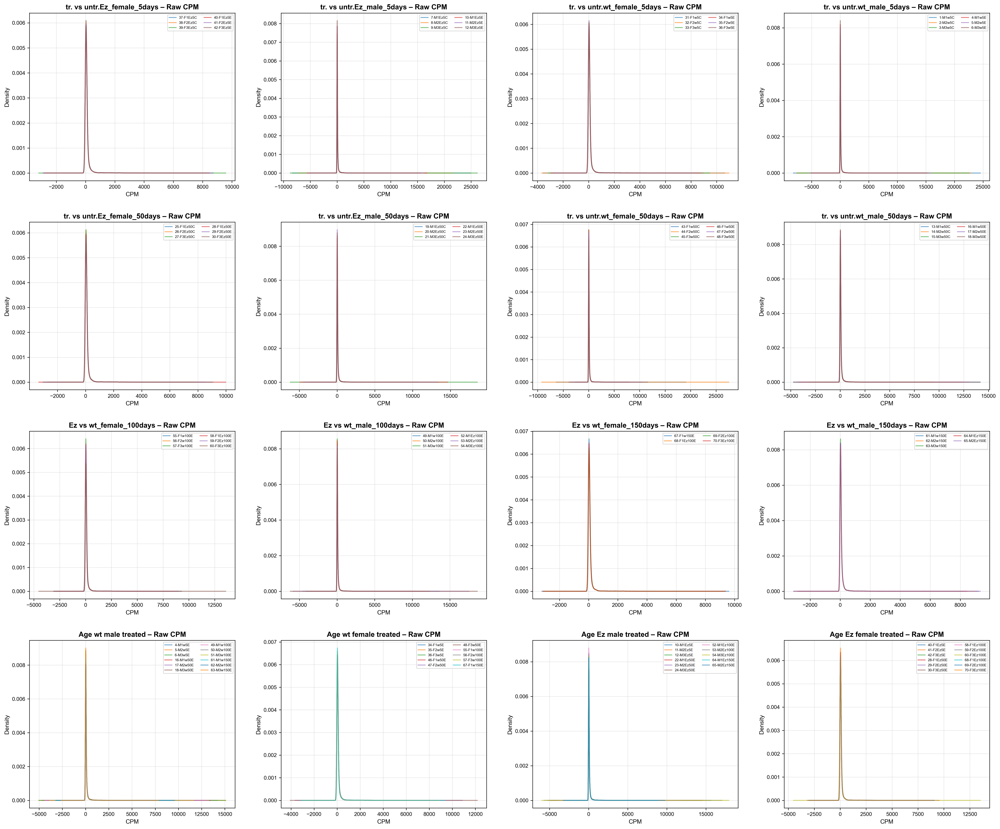

In [9]:
# before and after

# before and after
# Plot distribution of raw CPM values in each sample using KDE
fig_before, axes_before = plt.subplots(4, 4, figsize=(24, 20))
axes_before = axes_before.flatten()

for idx, (sheet, df) in enumerate(cleaned_data.items()):
    ax = axes_before[idx]
    for col in df.columns:
        df[col].plot(kind='kde', ax=ax, label=col, alpha=0.6)
    ax.set_title(f'{sheet} – Raw CPM', fontsize=12, weight='bold')
    ax.set_xlabel('CPM', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    ax.grid(axis='both', alpha=0.3)
    ax.legend(fontsize=6, ncol=2, loc='best')

for idx in range(len(cleaned_data), len(axes_before)):
    axes_before[idx].set_visible(False)

plt.tight_layout()
plt.show()


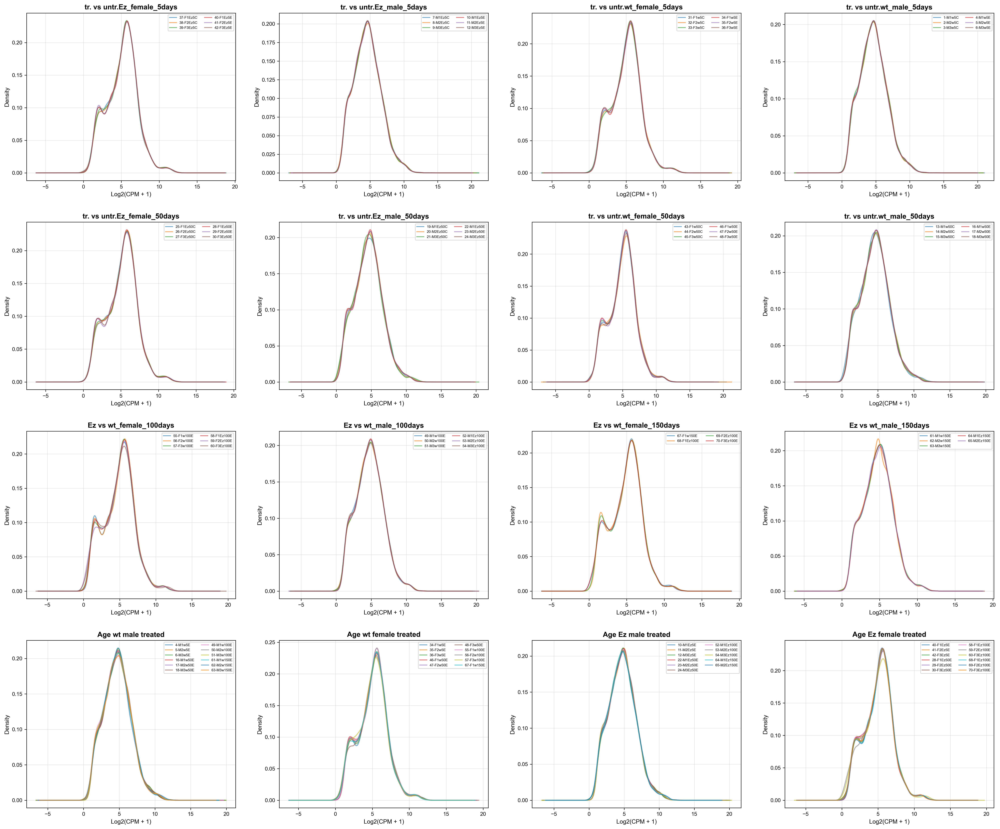

In [10]:


# Plot distribution of values in each sample using KDE
fig, axes = plt.subplots(4, 4, figsize=(24, 20))
axes = axes.flatten()

for idx, (sheet, df) in enumerate(preprocessed_data_log.items()):
    ax = axes[idx]
    
    # Plot KDE for each sample
    for col in df.columns:
        df[col].plot(kind='kde', ax=ax, label=col, alpha=0.6)
    
    ax.set_title(f'{sheet}', fontsize=12, weight='bold')
    ax.set_xlabel('Log2(CPM + 1)', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    ax.grid(axis='both', alpha=0.3)
    ax.legend(fontsize=6, ncol=2, loc='best')

# Hide unused subplots
for idx in range(len(preprocessed_data_log), len(axes)):
    axes[idx].set_visible(False)

plt.tight_layout()
plt.show()

---

## 3. Sample Description

Extract sample identifiers and group labels from the processed data columns.

In [11]:
import re

# Regular expression to parse sample names
pattern = r'(?P<ID>\d+)-(?P<Gender>[MF])(?P<Number>\d+)(?P<Genotype>Ez|w)(?P<Age>\d+)(?P<Condition>[CE])'
condition_map = {'C': 'Control', 'E': 'Treated'}

# Create sample_info dictionary from column names
sample_info = {}
unique_samples = set()
group_counts = {}

for sheet, df in cleaned_data.items():
    # Extract sample info from column names
    samples = []
    for col in df.columns:
        match = re.match(pattern, col)
        if match:
            sample_dict = match.groupdict()
            sample_dict['Sample'] = col
            sample_dict['Group'] = col  # Initial group is just the column name
            samples.append(sample_dict)
    
    # Convert to DataFrame for easier handling
    sample_df = pd.DataFrame(samples)
    if len(sample_df) == 0:
        print(f"Warning: No parsable sample names found in sheet '{sheet}'")
        continue
        
    # Convert Age to integer
    sample_df['Age'] = sample_df['Age'].astype(int)
    
    # Map condition codes to full names
    sample_df['Condition'] = sample_df['Condition'].map(condition_map)
    
    # Remove duplicate samples (keeping track of which we've seen)
    before_dedup = len(sample_df)
    sample_df = sample_df.drop_duplicates(subset=['Sample'])
    after_dedup = len(sample_df)
    if before_dedup > after_dedup:
        print(f"Removed {before_dedup - after_dedup} duplicate samples in '{sheet}'")
    
    # Store in dictionary
    sample_info[sheet] = sample_df
    
    # Count unique combinations by grouping variables
    group_counts[sheet] = (
        sample_df
        .groupby(['Gender', 'Genotype', 'Age', 'Condition'])
        .size()
        .reset_index()
        .rename(columns={0: 'Count'})
        .sort_values('Count', ascending=False)
    )
    
    # Add to global set of unique samples
    unique_samples.update(sample_df['Sample'])


# Show summary of all groups across sheets
print("\nAll experimental groups across sheets:")
all_groups_summary = pd.concat(
    [df.assign(Sheet=sheet) for sheet, df in group_counts.items()]
)
display(all_groups_summary)



All experimental groups across sheets:


,Gender,Genotype,Age,Condition,Count,Sheet
0,F,Ez,5,Control,3,tr. vs untr.Ez_female_5days
1,F,Ez,5,Treated,3,tr. vs untr.Ez_female_5days
0,M,Ez,5,Control,3,tr. vs untr.Ez_male_5days
1,M,Ez,5,Treated,3,tr. vs untr.Ez_male_5days
0,F,w,5,Control,3,tr. vs untr.wt_female_5days
1,F,w,5,Treated,3,tr. vs untr.wt_female_5days
0,M,w,5,Control,3,tr. vs untr.wt_male_5days
1,M,w,5,Treated,3,tr. vs untr.wt_male_5days
0,F,Ez,50,Control,3,tr. vs untr.Ez_female_50days
1,F,Ez,50,Treated,3,tr. vs untr.Ez_female_50days


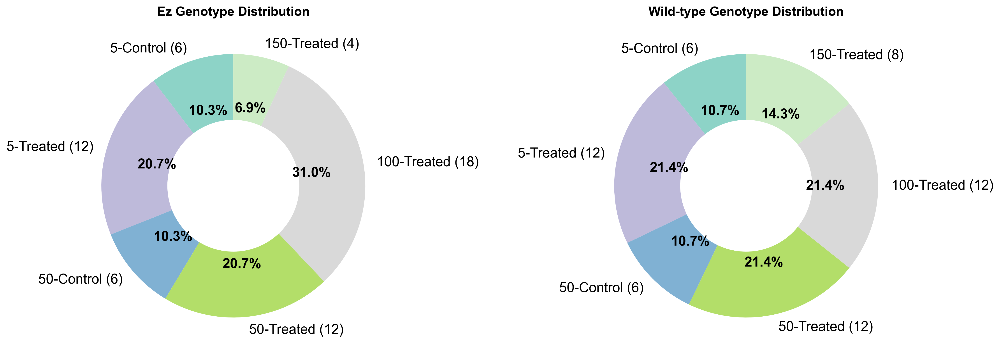

In [12]:
# Create separate pie charts for each genotype with consistent colors
genotype_data = all_groups_summary.groupby(['Genotype', 'Age', 'Condition'])['Count'].sum()

# Create a consistent color mapping for all age-condition combinations
all_combinations = set()
for genotype in ['Ez', 'w']:
    if genotype in genotype_data.index:
        for age_cond in genotype_data[genotype].index:
            all_combinations.add(age_cond)

# Sort combinations for consistent ordering
sorted_combinations = sorted(all_combinations)
color_map = {combo: plt.cm.Set3(i/len(sorted_combinations)) for i, combo in enumerate(sorted_combinations)}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Ez genotype pie chart
ez_data = genotype_data['Ez']
ez_colors = [color_map[age_cond] for age_cond in ez_data.index]
wedges1, texts1, autotexts1 = ax1.pie(
    ez_data.values,
    labels=[f"{age}-{cond} ({count})" for (age, cond), count in ez_data.items()],
    autopct='%1.1f%%',
    startangle=90,
    colors=ez_colors,
    wedgeprops=dict(width=0.5)
)

for t in texts1:
    t.set_fontsize(15)
for at in autotexts1:
    at.set_color('black')
    at.set_fontsize(15)
    at.set_weight('bold')

ax1.set_title('Ez Genotype Distribution', fontsize=14, weight='bold')

# Wild-type genotype pie chart
wt_data = genotype_data['w']
wt_colors = [color_map[age_cond] for age_cond in wt_data.index]
wedges2, texts2, autotexts2 = ax2.pie(
    wt_data.values,
    labels=[f"{age}-{cond} ({count})" for (age, cond), count in wt_data.items()],
    autopct='%1.1f%%',
    startangle=90,
    colors=wt_colors,
    wedgeprops=dict(width=0.5)
)

for t in texts2:
    t.set_fontsize(15)
for at in autotexts2:
    at.set_color('black')
    at.set_fontsize(15)
    at.set_weight('bold')

ax2.set_title('Wild-type Genotype Distribution',fontsize=14, weight='bold')

plt.tight_layout()
plt.show()


---

## 4. Dimensionality reduction

Plot embeddings

c:\Users\tyrealex\OneDrive - Texas Tech University\Yim Lab\fruit_fly\ffly\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Common genes across all sheets: 8989
Combined data shape: (114, 8989)
Metadata shape: (114, 9)


c:\Users\tyrealex\OneDrive - Texas Tech University\Yim Lab\fruit_fly\ffly\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


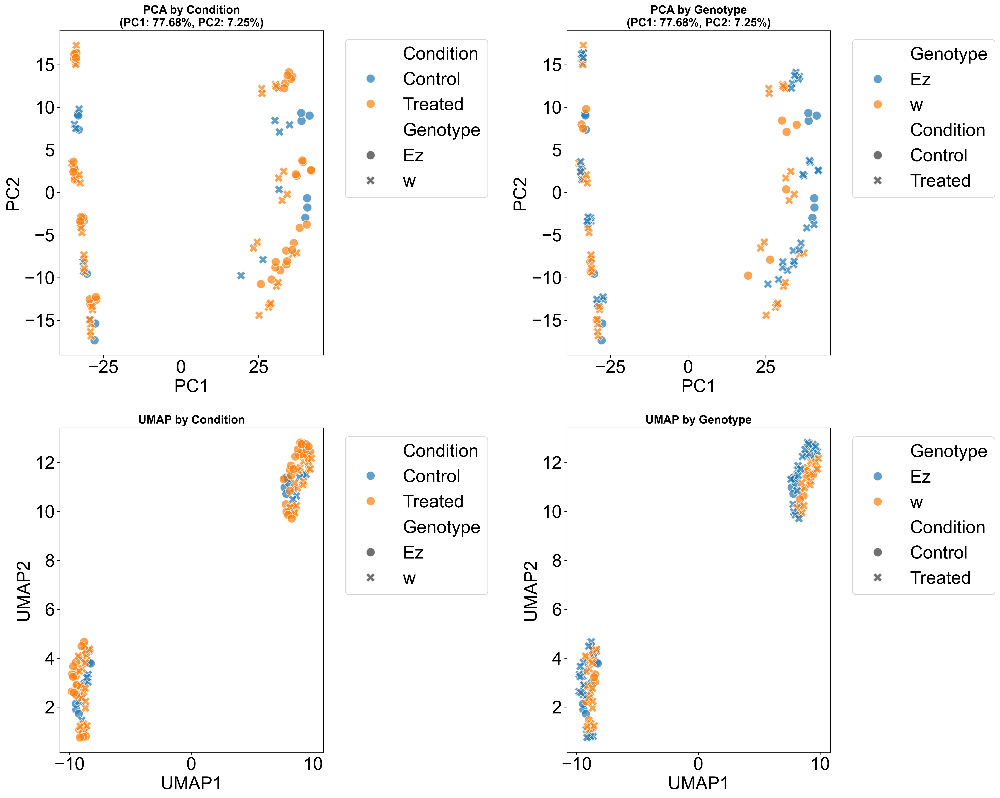

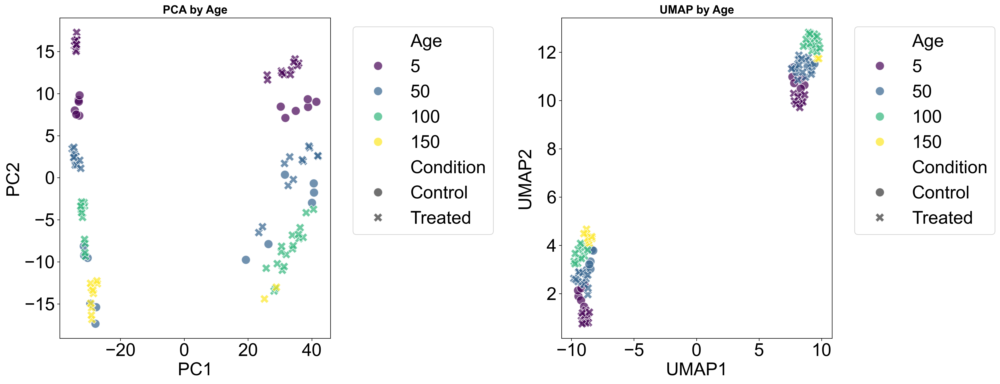

In [13]:
from sklearn.decomposition import PCA
from umap.umap_ import UMAP
import seaborn as sns

# Find common genes across all sheets
common_genes = set(preprocessed_data[first_sheet].index)
for sheet, df in preprocessed_data.items():
    common_genes = common_genes.intersection(set(df.index))

print(f"Common genes across all sheets: {len(common_genes)}")

# Combine data for common genes
combined_data = []
combined_metadata = []

for sheet, df in preprocessed_data.items():
    # Filter to common genes only
    df_common = df.loc[list(common_genes)]
    
    # Transpose so samples are rows
    df_t = df_common.T
    
    # Convert column names to strings to avoid mixed type issues
    df_t.columns = df_t.columns.astype(str)
    
    # Get metadata for this sheet
    meta = sample_info[sheet].copy()
    meta['Sheet'] = sheet
    
    combined_data.append(df_t)
    combined_metadata.append(meta)

# Concatenate all data
X_combined = pd.concat(combined_data, axis=0)
metadata_combined = pd.concat(combined_metadata, axis=0).reset_index(drop=True)

print(f"Combined data shape: {X_combined.shape}")
print(f"Metadata shape: {metadata_combined.shape}")

# Perform PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_combined)

# Perform UMAP
umap_model = UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
X_umap = umap_model.fit_transform(X_combined)

# Create DataFrames for plotting
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df = pd.concat([pca_df, metadata_combined], axis=1)

umap_df = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2'])
umap_df = pd.concat([umap_df, metadata_combined], axis=1)

# Plot PCA and UMAP
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

# PCA by Condition
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Condition', 
                style='Genotype', s=150, alpha=0.7, ax=axes[0, 0])
axes[0, 0].set_title(f'PCA by Condition\n(PC1: {pca.explained_variance_ratio_[0]:.2%}, PC2: {pca.explained_variance_ratio_[1]:.2%})', 
                     fontsize=16, weight='bold')
axes[0, 0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# PCA by Genotype
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Genotype', 
                style='Condition', s=150, alpha=0.7, ax=axes[0, 1])
axes[0, 1].set_title(f'PCA by Genotype\n(PC1: {pca.explained_variance_ratio_[0]:.2%}, PC2: {pca.explained_variance_ratio_[1]:.2%})', 
                     fontsize=16, weight='bold')
axes[0, 1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# UMAP by Condition
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='Condition', 
                style='Genotype', s=150, alpha=0.7, ax=axes[1, 0])
axes[1, 0].set_title('UMAP by Condition', fontsize=16, weight='bold')
axes[1, 0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# UMAP by Genotype
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='Genotype', 
                style='Condition', s=150, alpha=0.7, ax=axes[1, 1])
axes[1, 1].set_title('UMAP by Genotype', fontsize=16, weight='bold')
axes[1, 1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

# Additional plot by Age
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Age', 
                style='Condition', s=150, alpha=0.7, ax=axes[0], palette='viridis')
axes[0].set_title('PCA by Age', fontsize=16, weight='bold')
axes[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='Age', 
                style='Condition', s=150, alpha=0.7, ax=axes[1], palette='viridis')
axes[1].set_title('UMAP by Age', fontsize=16, weight='bold')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

trend anaysis


Calculating expression trends by group...

Analyzing group: Male Control Wild
Found 6 samples matching {'Gender': 'M', 'Condition': 'Control', 'Genotype': 'w'}
  Age 5: 3 samples
  Age 50: 3 samples

Analyzing group: Male Treated Wild
Found 24 samples matching {'Gender': 'M', 'Condition': 'Treated', 'Genotype': 'w'}
  Age 5: 6 samples
  Age 50: 6 samples
  Age 100: 6 samples
  Age 150: 6 samples

Analyzing group: Female Control Wild
Found 6 samples matching {'Gender': 'F', 'Condition': 'Control', 'Genotype': 'w'}
  Age 5: 3 samples
  Age 50: 3 samples

Analyzing group: Female Treated Wild
Found 20 samples matching {'Gender': 'F', 'Condition': 'Treated', 'Genotype': 'w'}
  Age 5: 6 samples
  Age 50: 6 samples
  Age 100: 6 samples
  Age 150: 2 samples

Analyzing group: Male Control Ez
Found 6 samples matching {'Gender': 'M', 'Condition': 'Control', 'Genotype': 'Ez'}
  Age 5: 3 samples
  Age 50: 3 samples

Analyzing group: Male Treated Ez
Found 22 samples matching {'Gender': 'M', 'Condit

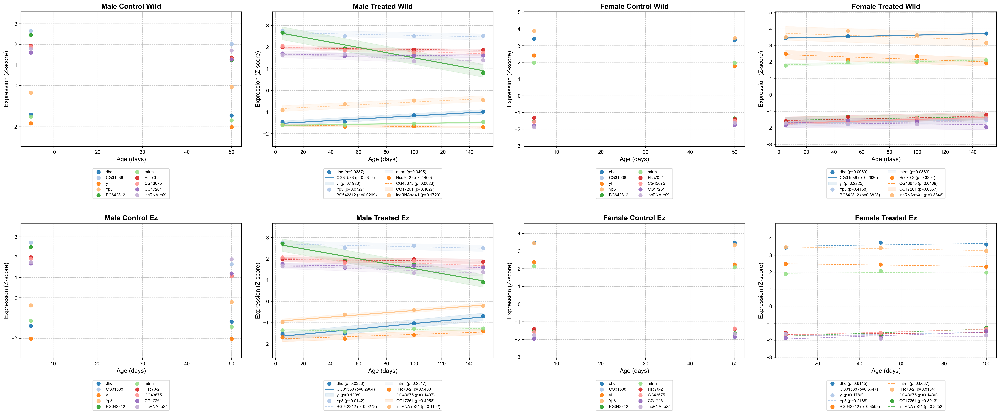


Age Trend Analysis Summary:


,Group,Age Range,Age Points,Total Samples,Genes Tested,Sig. Trends
0,Male Control Wild,5-50,2,6,0,0
1,Male Treated Wild,5-150,4,24,10,3
2,Female Control Wild,5-50,2,6,0,0
3,Female Treated Wild,5-150,4,20,10,2
4,Male Control Ez,5-50,2,6,0,0
5,Male Treated Ez,5-150,4,22,10,3
6,Female Control Ez,5-50,2,6,0,0
7,Female Treated Ez,5-100,3,24,10,0


In [27]:
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt

# ==========================================
# COMPLETELY REWRITTEN TREND ANALYSIS SECTION
# ==========================================

# Check if required variables exist, if not use available data
if 'metadata_combined' not in globals():
    print("Using pca_df as metadata source")
    metadata_combined = pca_df.copy()

if 'X_combined' not in globals():
    # Use the available normalized data
    if 'norm_df' in globals():
        print("Using norm_df as expression data")
        X_combined = norm_df.T  # Transpose so samples are rows, genes are columns
    else:
        print("No expression data available")
        X_combined = pd.DataFrame()

# Define sample groups for trend analysis
trend_groups = {
    'Male Control Wild': {'Gender': 'M', 'Condition': 'Control', 'Genotype': 'w'},
    'Male Treated Wild': {'Gender': 'M', 'Condition': 'Treated', 'Genotype': 'w'},
    'Female Control Wild': {'Gender': 'F', 'Condition': 'Control', 'Genotype': 'w'},
    'Female Treated Wild': {'Gender': 'F', 'Condition': 'Treated', 'Genotype': 'w'},
    'Male Control Ez': {'Gender': 'M', 'Condition': 'Control', 'Genotype': 'Ez'},
    'Male Treated Ez': {'Gender': 'M', 'Condition': 'Treated', 'Genotype': 'Ez'},
    'Female Control Ez': {'Gender': 'F', 'Condition': 'Control', 'Genotype': 'Ez'},
    'Female Treated Ez': {'Gender': 'F', 'Condition': 'Treated', 'Genotype': 'Ez'}
}

# Calculate mean expression for each group at each age - completely rewritten
def get_group_expression_by_age(group_criteria):
    """Get mean expression for samples matching criteria, grouped by age"""
    age_expression = {}
    
    if X_combined.empty:
        print(f"Empty expression data for group criteria: {group_criteria}")
        return {}
    
    # Filter metadata to get samples matching criteria
    mask = pd.Series([True] * len(metadata_combined))
    for key, value in group_criteria.items():
        if key in metadata_combined.columns:
            mask = mask & (metadata_combined[key] == value)
    
    # Get matching samples and their ages
    matching_metadata = metadata_combined[mask]
    if len(matching_metadata) == 0:
        print(f"No metadata matches criteria: {group_criteria}")
        return {}
    
    # Filter samples to only those that exist in expression data
    matching_samples = matching_metadata['Sample'].tolist()
    available_samples = [s for s in matching_samples if s in X_combined.index]
    
    if len(available_samples) == 0:
        print(f"No expression samples match criteria: {group_criteria}")
        return {}
    
    print(f"Found {len(available_samples)} samples matching {group_criteria}")
    
    # Get unique ages for matching samples
    ages = matching_metadata['Age'].unique()
    
    # Group by age and calculate mean expression
    for age in sorted(ages):
        # Get samples for this age
        age_samples = matching_metadata[matching_metadata['Age'] == age]['Sample'].tolist()
        age_samples = [s for s in age_samples if s in X_combined.index]
        
        if len(age_samples) > 0:
            # Get expression data for these samples
            age_data = X_combined.loc[age_samples].mean(axis=0)
            age_expression[age] = age_data
            print(f"  Age {age}: {len(age_samples)} samples")
    
    return age_expression

# Calculate expression trends for each group
print("\nCalculating expression trends by group...")
group_trends = {}
for group_name, criteria in trend_groups.items():
    print(f"\nAnalyzing group: {group_name}")
    trends = get_group_expression_by_age(criteria)
    if len(trends) > 0:
        group_trends[group_name] = trends

# Select most variable genes using a more robust approach
print("\nIdentifying most variable genes...")
if not X_combined.empty:
    # Calculate variance for each gene across all samples
    gene_variance = X_combined.var(axis=0)
    
    # Sort by variance and take top 20
    top_variable_genes = gene_variance.nlargest(20).index.tolist()
    print(f"Selected {len(top_variable_genes)} most variable genes")
    
    # Verify all selected genes exist in our datasets
    for group_name, trends in group_trends.items():
        if trends:
            first_age = list(trends.keys())[0]
            missing_genes = [g for g in top_variable_genes if g not in trends[first_age].index]
            if missing_genes:
                print(f"Warning: {len(missing_genes)} genes missing from {group_name}")
                print(f"Missing: {missing_genes}")
else:
    print("No expression data available to identify variable genes")
    top_variable_genes = []

# Check if we have any trends to plot
if len(group_trends) == 0:
    print("\nNo trend data available with current dataset structure")
    print("Available columns in metadata:", metadata_combined.columns.tolist())
    print("Sample of metadata:")
    display(metadata_combined.head())
elif len(top_variable_genes) == 0:
    print("\nNo variable genes identified")
else:
    print(f"\nPlotting age trends for {len(group_trends)} groups and {len(top_variable_genes)} genes...")
    
    # Create subplots for each sample group
    fig, axes = plt.subplots(2, 4, figsize=(28, 12))
    axes = axes.flatten()

    # Use a better color palette with more distinct colors
    colors = plt.cm.tab20(np.linspace(0, 1, len(top_variable_genes)))

    for idx, (group_name, trends) in enumerate(group_trends.items()):
        if idx >= len(axes):
            break
            
        ax = axes[idx]
        
        if len(trends) < 2:  # Need at least 2 age points for trend
            ax.text(0.5, 0.5, f'Insufficient data\nfor {group_name}', 
                    ha='center', va='center', transform=ax.transAxes)
            ax.set_title(group_name, fontsize=14, weight='bold')
            continue
        
        ages = sorted(trends.keys())
        age_range = max(ages) - min(ages)
        
        # Create a finer x-axis for smoother trend lines
        x_fine = np.linspace(min(ages), max(ages), 100)
        
        # Store gene labels for legend
        legend_elements = []
        
        # Plot trends for top variable genes - with better error handling
        for gene_idx, gene in enumerate(top_variable_genes[:10]):  # Plot top 10 for clarity
            # Skip genes not in the dataset for this group
            if gene not in trends[ages[0]].index:
                continue
                
            # Safely collect expression values
            expression_values = []
            for age in ages:
                if gene in trends[age].index:
                    expression_values.append(trends[age][gene])
                else:
                    print(f"Warning: Gene {gene} missing for age {age} in {group_name}")
                    # Use NaN to mark missing data
                    expression_values.append(np.nan)
            
            # Skip if we have NaNs
            if np.isnan(expression_values).any():
                continue
                
            # Plot original points
            ax.scatter(ages, expression_values, s=50,
                     color=colors[gene_idx], alpha=0.9, zorder=10)
            
            # Add trend line with stats
            if len(ages) > 2:  # Need at least 3 points for meaningful regression
                slope, intercept, r_value, p_value, std_err = stats.linregress(ages, expression_values)
                
                # Create trend line
                trend_line = slope * x_fine + intercept
                
                # Line style based on significance
                linestyle = '-' if p_value < 0.05 else '--'
                linewidth = 2 if p_value < 0.05 else 1
                
                # Plot line with statistical annotation
                line = ax.plot(x_fine, trend_line, 
                              linestyle=linestyle, linewidth=linewidth,
                              color=colors[gene_idx], alpha=0.8, zorder=5)[0]
                
                # Add confidence interval (95%)
                if len(ages) > 3:  # Need 4+ points for confidence interval
                    # Calculate residuals and prediction interval
                    residuals = np.array(expression_values) - (np.array(ages) * slope + intercept)
                    std_residuals = np.std(residuals)
                    
                    # 95% prediction interval
                    pi = 1.96 * std_residuals
                    ax.fill_between(x_fine, 
                                   trend_line - pi, 
                                   trend_line + pi, 
                                   color=colors[gene_idx], alpha=0.1)
                
                # Add to legend with p-value
                legend_elements.append(f"{gene} (p={p_value:.4f})")
            else:
                # Add to legend without p-value
                legend_elements.append(str(gene))
        
        # Set plot labels and style
        ax.set_title(group_name, fontsize=14, weight='bold')
        ax.set_xlabel('Age (days)', fontsize=12)
        ax.set_ylabel('Expression (Z-score)', fontsize=12)
        ax.grid(True, linestyle='--', alpha=0.7)
        ax.tick_params(axis='both', labelsize=10)
        
        # Add legend with smaller font outside the plot
        if legend_elements:
            ax.legend(legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.15),
                      ncol=2, fontsize=8)
        else:
            ax.text(0.5, 0.5, "No plottable genes found", 
                    ha='center', va='center', transform=ax.transAxes)
        
        # Set nice y-axis limits - with robust handling
        y_data = []
        for gene in top_variable_genes[:10]:
            for age in ages:
                if age in trends and gene in trends[age].index:
                    y_data.append(trends[age][gene])
        
        if y_data:
            y_min, y_max = min(y_data), max(y_data)
            margin = (y_max - y_min) * 0.2
            ax.set_ylim(y_min - margin, y_max + margin)

    # Hide unused subplots
    for idx in range(len(group_trends), len(axes)):
        axes[idx].set_visible(False)

    plt.tight_layout()
    plt.show()

    # Create summary statistics table with trend information
    print("\nAge Trend Analysis Summary:")
    print("="*80)

    summary_data = []
    for group_name, trends in group_trends.items():
        if len(trends) >= 2:
            ages = sorted(trends.keys())
            age_range = f"{min(ages)}-{max(ages)}"
            n_ages = len(ages)
            
            # Count samples more safely
            criteria = trend_groups[group_name]
            sample_mask = pd.Series([True] * len(metadata_combined))
            for key, value in criteria.items():
                if key in metadata_combined.columns:
                    sample_mask = sample_mask & (metadata_combined[key] == value)
            
            n_samples = len(metadata_combined[sample_mask])
            
            # Calculate number of significant trends - with better error handling
            sig_trends = 0
            genes_tested = 0
            
            if len(ages) > 2 and top_variable_genes:
                for gene in top_variable_genes[:min(10, len(top_variable_genes))]:
                    # Collect expression values carefully
                    expression_values = []
                    valid_gene = True
                    
                    for age in ages:
                        if gene in trends[age].index:
                            expression_values.append(trends[age][gene])
                        else:
                            valid_gene = False
                            break
                    
                    if valid_gene and len(expression_values) > 2:
                        genes_tested += 1
                        _, _, _, p_value, _ = stats.linregress(ages, expression_values)
                        if p_value < 0.05:
                            sig_trends += 1
            
            summary_data.append({
                'Group': group_name,
                'Age Range': age_range,
                'Age Points': n_ages,
                'Total Samples': n_samples,
                'Genes Tested': genes_tested,
                'Sig. Trends': sig_trends
            })

    if summary_data:
        summary_df = pd.DataFrame(summary_data)
        display(summary_df)
    else:
        print("No summary data available")

---

## 5. Differential Analysis

Perform univariate statistical tests (e.g., t-test) between groups to identify differentially abundant features.

volcano plots etc

c:\Users\tyrealex\OneDrive - Texas Tech University\Yim Lab\fruit_fly\ffly\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\tyrealex\OneDrive - Texas Tech University\Yim Lab\fruit_fly\ffly\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


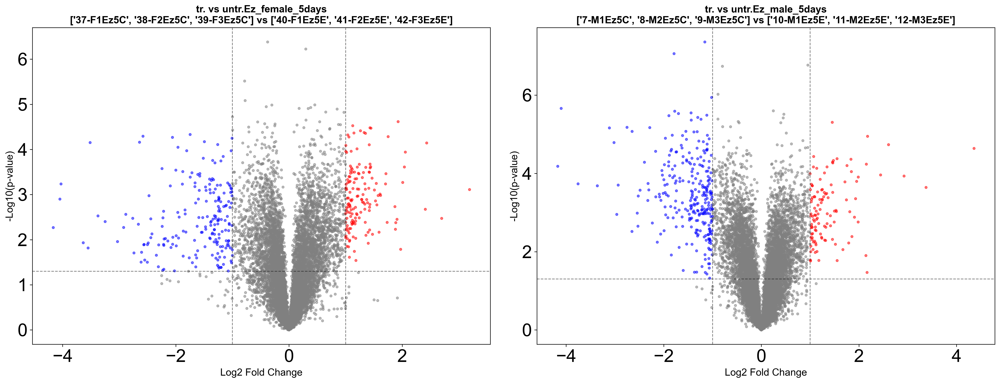

In [14]:
from scipy.stats import ttest_ind

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Process first 2 sheets
for idx, sheet in enumerate(sheet_names[:2]):
    df = preprocessed_data_log[sheet]
    
    # Get first 3 and last 3 samples
    samples = df.columns.tolist()
    group1_samples = samples[:3]
    group2_samples = samples[-3:]
    
    # Extract data for each group
    group1_data = df[group1_samples]
    group2_data = df[group2_samples]
    
    # Calculate fold change and p-values
    fold_changes = []
    p_values = []
    
    for gene in df.index:
        # Calculate mean difference (log2 fold change)
        fc = group2_data.loc[gene].mean() - group1_data.loc[gene].mean()
        
        # Perform t-test
        stat_result = ttest_ind(group1_data.loc[gene], group2_data.loc[gene])
        
        fold_changes.append(fc)
        p_values.append(stat_result.pvalue)
    
    # Convert p-values to -log10
    neg_log_pvals = -np.log10(np.array(p_values) + 1e-300)  # Add small value to avoid log(0)
    
    # Plot volcano
    ax = axes[idx]
    
    # Color points based on significance thresholds
    sig_threshold = 0.05
    fc_threshold = 1.0
    
    colors = []
    for fc, pval in zip(fold_changes, p_values):
        if pval < sig_threshold and abs(fc) > fc_threshold:
            colors.append('red' if fc > 0 else 'blue')
        else:
            colors.append('gray')
    
    ax.scatter(fold_changes, neg_log_pvals, c=colors, alpha=0.5, s=10)
    
    # Add threshold lines
    ax.axhline(-np.log10(sig_threshold), color='black', linestyle='--', linewidth=1, alpha=0.5)
    ax.axvline(fc_threshold, color='black', linestyle='--', linewidth=1, alpha=0.5)
    ax.axvline(-fc_threshold, color='black', linestyle='--', linewidth=1, alpha=0.5)
    
    ax.set_xlabel('Log2 Fold Change', fontsize=14)
    ax.set_ylabel('-Log10(p-value)', fontsize=14)
    ax.set_title(f'{sheet}\n{group1_samples} vs {group2_samples}', fontsize=14, weight='bold')
    # ax.grid(alpha=0.3)
    
    # Add legend
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label='Up (sig)'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label='Down (sig)'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=8, label='Not sig')
    ]
    # ax.legend(handles=legend_elements, loc='upper right')
    

plt.tight_layout()
plt.show()

---

## 6. XGBoost Classification and Performance

Train an XGBoost model to classify samples and evaluate accuracy.

Training XGBoost classifiers for all variables...

Training classifier for: Condition

Class distribution:
Condition
Treated    90
Control    24
Name: count, dtype: int64
Encoded as: {'Control': np.int64(0), 'Treated': np.int64(1)}

Train set size: 91
Test set size: 23

Accuracy: 86.96%

Classification Report:
              precision    recall  f1-score   support

     Control       1.00      0.40      0.57         5
     Treated       0.86      1.00      0.92        18

    accuracy                           0.87        23
   macro avg       0.93      0.70      0.75        23
weighted avg       0.89      0.87      0.85        23


Training classifier for: Genotype

Class distribution:
Genotype
Ez    58
w     56
Name: count, dtype: int64
Encoded as: {'Ez': np.int64(0), 'w': np.int64(1)}

Train set size: 91
Test set size: 23

Accuracy: 100.00%

Classification Report:
              precision    recall  f1-score   support

          Ez       1.00      1.00      1.00        12
           w

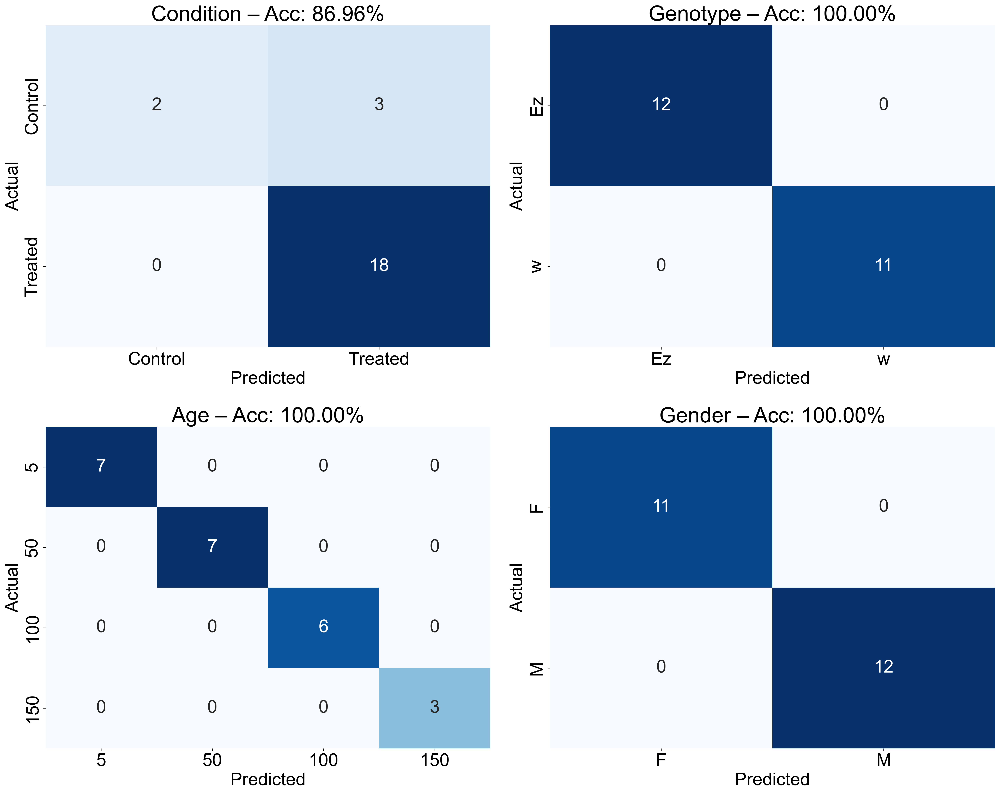

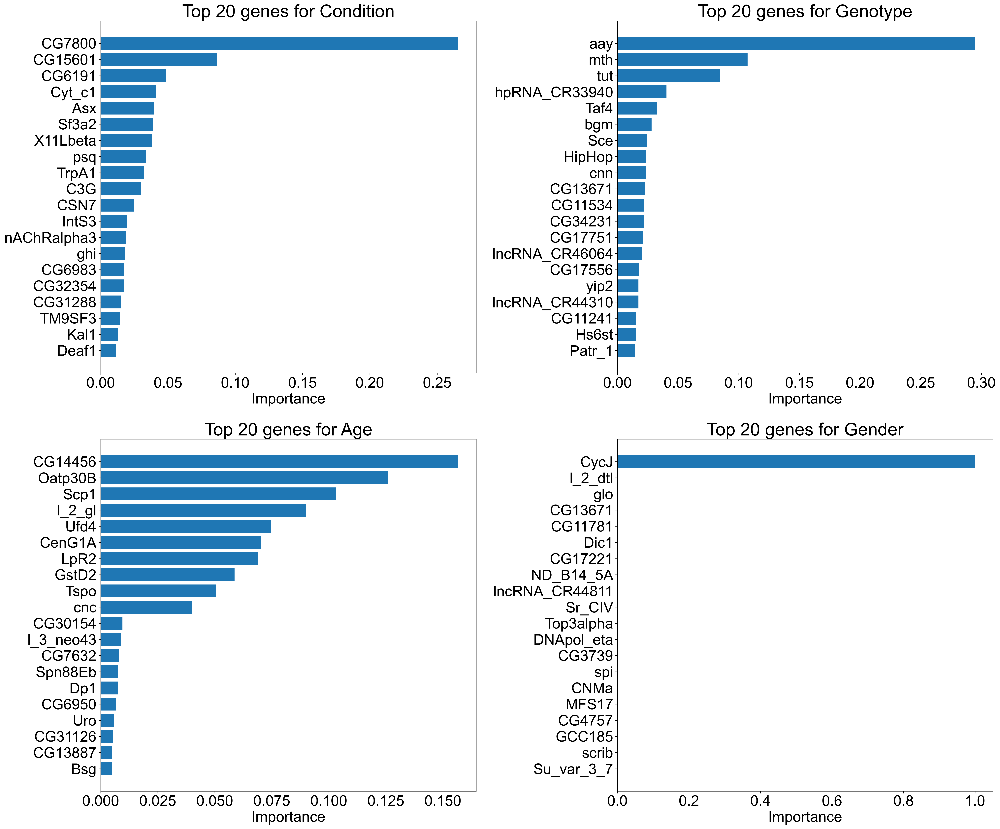


SUMMARY: XGBoost Classification Results


,Target,Accuracy,Classes
0,Condition,0.869565,2
1,Genotype,1.000000,2
2,Age,1.000000,4
3,Gender,1.000000,2


In [15]:
import re
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

print("Training XGBoost classifiers for all variables...")

# Define target variables to classify
targets = {
    'Condition': metadata_combined['Condition'],
    'Genotype':  metadata_combined['Genotype'],
    'Age':       metadata_combined['Age'],
    'Gender':    metadata_combined['Gender']
}

# Prepare data
X = X_combined.copy()

# Sanitize feature names: replace invalid characters with underscore
X.columns = [
    re.sub(r'[^A-Za-z0-9_]+', '_', str(col))
    for col in X.columns
]

# Store results for all classifiers
results = {}

for target_name, y in targets.items():
    print(f"\n{'='*60}")
    print(f"Training classifier for: {target_name}")
    print(f"{'='*60}")
    
    # Encode labels
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    
    print("\nClass distribution:")
    print(y.value_counts())
    print(f"Encoded as: {dict(zip(le.classes_, le.transform(le.classes_)))}")
    
    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y_encoded, stratify=y_encoded, test_size=0.2, random_state=42
    )
    print(f"\nTrain set size: {len(X_train)}")
    print(f"Test set size: {len(X_test)}")
    
    # Fit model
    model = xgb.XGBClassifier(
        eval_metric='logloss',
        random_state=42,
        max_depth=6,
        learning_rate=0.1,
        n_estimators=100
    )
    model.fit(X_train, y_train)
    
    # Predict & evaluate
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    y_test_decoded = le.inverse_transform(y_test)
    y_pred_decoded = le.inverse_transform(y_pred)
    
    print(f"\nAccuracy: {acc:.2%}")
    print("\nClassification Report:")
    print(classification_report(y_test_decoded, y_pred_decoded))
    
    results[target_name] = {
        'model':         model,
        'accuracy':      acc,
        'y_test':        y_test_decoded,
        'y_pred':        y_pred_decoded,
        'label_encoder': le
    }

# Plot confusion matrices
fig, axes = plt.subplots(2, 2, figsize=(20, 16))
axes = axes.flatten()
for idx, (name, res) in enumerate(results.items()):
    cm = confusion_matrix(res['y_test'], res['y_pred'])
    classes = sorted(set(res['y_test']))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes,
                ax=axes[idx], cbar_kws={'label':'Count'}, cbar=False)
    axes[idx].set_xlabel('Predicted')
    axes[idx].set_ylabel('Actual')
    axes[idx].set_title(f"{name} – Acc: {res['accuracy']:.2%}")
plt.tight_layout()
plt.show()

# Plot feature importance
fig, axes = plt.subplots(2, 2, figsize=(24, 20))
axes = axes.flatten()
for idx, (name, res) in enumerate(results.items()):
    fi = pd.DataFrame({
        'Gene':       X.columns,
        'Importance': res['model'].feature_importances_
    }).nlargest(20, 'Importance')
    axes[idx].barh(fi['Gene'], fi['Importance'])
    axes[idx].invert_yaxis()
    axes[idx].set_title(f"Top 20 genes for {name}")
    axes[idx].set_xlabel('Importance')
plt.tight_layout()
plt.show()

# Summary table
summary_df = pd.DataFrame({
    'Target':   list(results.keys()),
    'Accuracy': [r['accuracy'] for r in results.values()],
    'Classes':  [len(set(r['y_test'])) for r in results.values()]
})
print("\n" + "="*60)
print("SUMMARY: XGBoost Classification Results")
print("="*60)
display(summary_df)


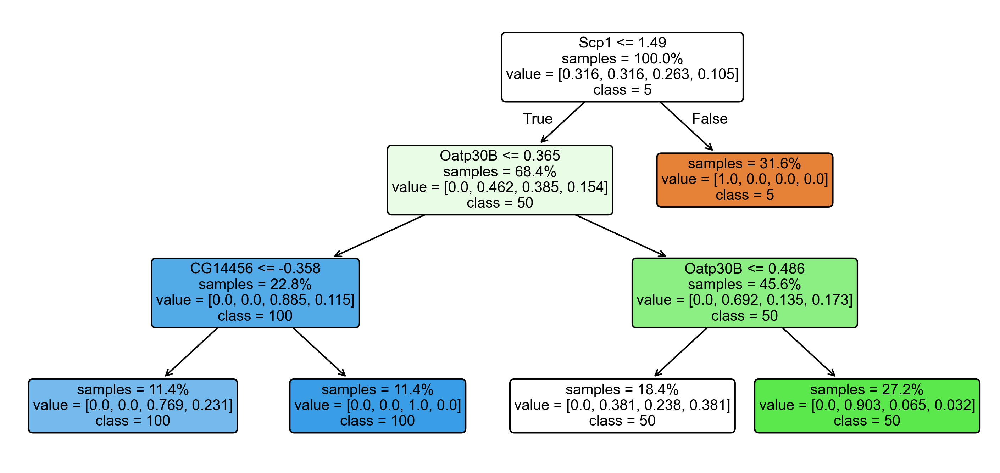

Top 3 features and their XGBoost importance:
CG14456: 0.1568
Oatp30B: 0.1259
Scp1: 0.1030


In [16]:
# Create a cleaner decision tree visualization
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Select top 3 genes by importance from the Age XGBoost model
age_model = results['Age']['model']
age_imp = pd.Series(age_model.feature_importances_, index=X.columns)
top_features = age_imp.nlargest(3).index.tolist()

# Prepare feature matrix and target
X_age_top = X_combined[top_features]
y_age = metadata_combined['Age']

# Fit a decision tree with better parameters for visualization
dtree = DecisionTreeClassifier(
    max_depth=3, 
    min_samples_split=10,
    min_samples_leaf=5,
    random_state=2
)
dtree.fit(X_age_top, y_age)

# Create a cleaner visualization
fig, ax = plt.subplots(figsize=(10,5))

# Import tree plotting function
from sklearn.tree import plot_tree

plot_tree(
    dtree,
    feature_names=top_features,
    class_names=[str(age) for age in sorted(dtree.classes_)],
    filled=True,
    rounded=True,
    fontsize=10,
    ax=ax,
    proportion=True,
    impurity=False
)

# ax.set_title("Decision Tree for Age Classification\nUsing Top 3 XGBoost Features", 
            #  fontsize=16, weight='bold', pad=20)

plt.tight_layout()
plt.show()

# Print feature importance values for context
print("Top 3 features and their XGBoost importance:")
for gene, importance in age_imp.nlargest(3).items():
    print(f"{gene}: {importance:.4f}")

---

## 7. Pathway Enrichment Analysis

Perform pathway enrichment using Enrichr via the `gseapy` Python package.

In [17]:
import gseapy as gp
from gseapy.plot import barplot

# Extract feature importances for the Age classifier
age_model = results['Age']['model']
age_imp = pd.Series(age_model.feature_importances_, index=X.columns)

# Select top 50 genes by importance
top50_age_genes = age_imp.nlargest(50).index.tolist()

# Run enrichment on those top genes
enr_age = gp.enrichr(
    gene_list=top50_age_genes,
    gene_sets=['KEGG_2019'],
    organism='fly',
    outdir=None
)

print("Enrichment results for top Age classifier features:")
display(enr_age.results.head())

# bar‐plot of top 10 enriched KEGG pathways
barplot(enr_age.res2d,
    title='KEGG_2019 Enrichment for Age Top 50 Genes',
    top_term=10,
    figsize=(8, 6))
plt.tight_layout()
plt.show()

Enrichment results for top Age classifier features:


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Z-score,Combined Score,Genes
0,KEGG_2019,Caffeine metabolism,1/6,0.014908,0.153699,0.032871,0.309069,-52.904339,222.506631,Uro
1,KEGG_2019,AGE-RAGE signaling pathway in diabetic complic...,1/31,0.074717,0.163300,0.142218,0.309069,-64.203637,166.547513,vkg
2,KEGG_2019,Folate biosynthesis,1/40,0.095364,0.176057,0.178674,0.329859,-66.684211,156.711216,phu
3,KEGG_2019,ECM-receptor interaction,1/12,0.029599,0.153699,0.060241,0.309069,-43.372469,152.671806,vkg
4,KEGG_2019,Glycolysis / Gluconeogenesis,1/54,0.126589,0.202542,0.232520,0.372032,-73.011559,150.901181,Gapdh1


ValueError: Warning: No enrich terms when cutoff = 0.05